Alexander S. Lundervold, v.05.03.24

# Introduction

Imagine a self-driving car cruising down the highway. Its deep learning vision system, usually so accurate, suddenly misclassifies a stop sign as a turn right sign. The consequences could be disastrous.

This isn't just hypothetical. It's a demonstration of the power of adversarial attacks. These attacks deliberately craft subtle perturbations to data that trick deep learning models into making incorrect decisions. In this notebook, we'll explore how these attacks work using a simple dog vs. cat classifier. 

An understanding of adversarial attacks is crucial for anyone working in deep learning engineering.

<iframe src="https://player.vimeo.com/video/366303036?h=867335654e&autoplay=1&loop=0&title=0&byline=0&portrait=0" width="640" height="360" frameborder="0" allow="autoplay; fullscreen; picture-in-picture" allowfullscreen></iframe>
<p><a href="https://vimeo.com/366303036">Stop Sign Video</a> from <a href="https://vimeo.com/princeton">Princeton University</a> on <a href="https://vimeo.com">Vimeo</a>.</p>

<small> Source: https://www.princeton.edu/news/2019/10/14/adversarial-machine-learning-artificial-intelligence-comes-new-types-attacks </small>

# Setup

In [1]:
# This is a quick check of whether the notebook is currently running on Kaggle, 
# as that makes some difference for the code below.
# We'll do this in every notebook of the course.
import os
kaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

In [2]:
from fastai.vision.all import *

/home/alex/anaconda3/envs/fastai/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: /home/alex/anaconda3/envs/fastai/lib/python3.9/site-packages/torchvision/image.so: undefined symbol: _ZN5torch3jit17parseSchemaOrNameERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE
  warn(f"Failed to load image Python extension: {e}")


In [3]:
import timm

In [4]:
from fastai.imports import *
NB_DIR = Path.cwd()

# Download data

We'll use the dogs versus cats data set from the Kaggle competition "Dogs vs. Cats Redux: Kernels Edition". The data set is available via fastai.

In [5]:
path = untar_data(URLs.DOGS)

In [6]:
path.ls()

(#6) [Path('/home/alex/.fastai/data/dogscats/sample'),Path('/home/alex/.fastai/data/dogscats/catsdogs_model.pkl'),Path('/home/alex/.fastai/data/dogscats/models'),Path('/home/alex/.fastai/data/dogscats/test1'),Path('/home/alex/.fastai/data/dogscats/train'),Path('/home/alex/.fastai/data/dogscats/valid')]

# Dataloader, model, and model training

We set up a dataloader, a CNN model, and train the model using the fastai library. We then evaluate the model's predictions.

This will be the model we attack later on.

In [7]:
sz=224
item_tfms = Resize(sz)
batch_tfms = None
bs=64

In [8]:
dls = ImageDataLoaders.from_folder(path, train='train', valid='valid', 
            item_tfms=item_tfms, batch_tfms=batch_tfms, bs=bs)

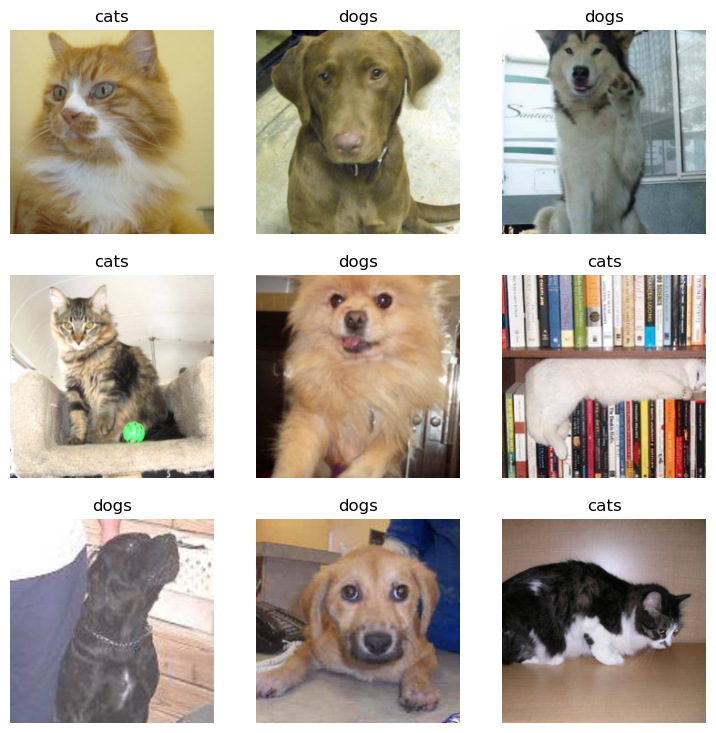

In [9]:
dls.show_batch()

We'll train a model using the fastai library. We'll use a pretrained ResNet18 model, and train it for a few epochs.

In [10]:
#model = 'convnext_small_in22ft1k'
model = resnet18

In [11]:
learn = vision_learner(dls, model, pretrained=True, metrics=accuracy)

/home/alex/anaconda3/envs/fastai/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/alex/anaconda3/envs/fastai/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [12]:
lr = learn.lr_find(suggest_funcs=(minimum, steep, valley), show_plot=False)
base_lr = (lr.valley + lr.steep)/2
print(base_lr)

0.00036461914714891464


In [13]:
learn.fine_tune(1, base_lr=base_lr)

Let's check that we have a reasonable model:

In [14]:
interp = ClassificationInterpretation.from_learner(learn)

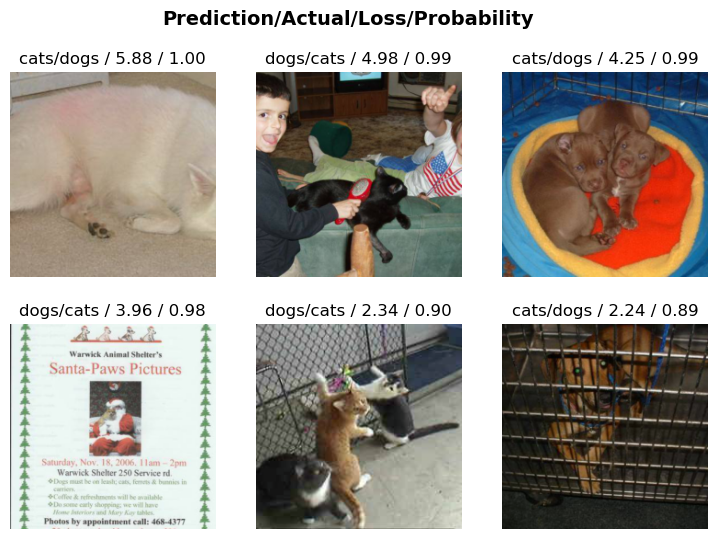

In [15]:
interp.plot_top_losses(6)

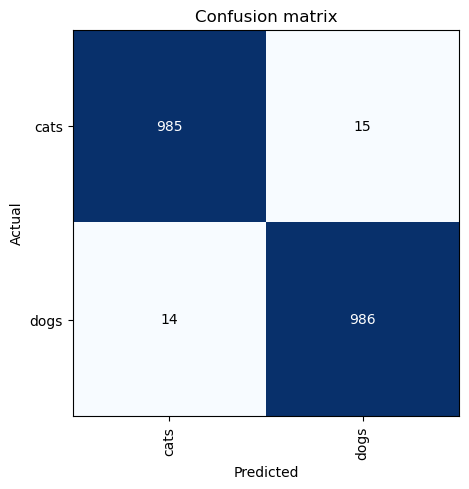

In [16]:
interp.plot_confusion_matrix()

The model is pretty good, making very few (unreasonable) mistakes.

In [17]:
if kaggle: 
    model_dir = Path('/kaggle/working/models/')
    model_dir.mkdir(exist_ok=True)
    learn.export(model_dir/'catsdogs_model.pkl')
else:
    learn.export('catsdogs_model.pkl')

# FSGM: A gradient-based attack

From [Module 3: Deep learning under the hood](https://hvl.instructure.com/courses/21919/pages/deep-learning-under-the-hood?module_item_id=618844), we remember that neural networks are trained using the following seven steps: 

<img src="https://github.com/HVL-ML/DAT255/raw/main/nbs/assets/fastai-train_nnet_figure.png"><br>
<center><small>Figure from the <a href="https://github.com/fastai/fastbook">fastai book.</a></small></center>

**Gradients and loss functions:**

* During training, the model adjusts its internal parameters (weights and biases) to minimize the loss function. The loss function measures how wrong the model's predictions are compared to the true labels.
* Gradients tell us how much the loss function changes with respect to a small change in a single parameter. They essentially point in the direction of the steepest increase in the loss function.


Thus, artificial neural networks are optimized to minimize the loss function by tweaking the parameters based on the gradients. 

**Intuition for gradient-based attacks**

Imagine a landscape where the height represents the loss function (higher = worse) and the x and y axes represent the image's pixels. The model wants to find the lowest valley (minimum loss) in this landscape.

* During training, the model adjusts its parameters like a hiker descending a hill, following the negative gradients (steepest decrease) until it reaches a valley (minimum loss).
* Adversarial attacks take the opposite approach. They start with an image the model classifies correctly (e.g., a cat) and want to push it towards a different classification (e.g., dog).
* By adding a small value in the direction of the positive gradients (steepest increase), we can nudge the image slightly in the input space but create a large change in the loss function, fooling the model.


This is the basic idea of the Fast Gradient Sign Method (FGSM), first described by Ian J. Goodfellow, Jonathon Shlens, Christian Szegedy in [Explaining and Harnessing Adversarial Examples](https://arxiv.org/abs/1412.6572), 2015. In this attack, we use the _signs_ of the gradient rather than the full gradient. See also the PyTorch Tutorial [FSGM_tutorial](https://pytorch.org/tutorials/beginner/fgsm_tutorial.html).

In [18]:
if kaggle: 
    learn = load_learner('/kaggle/working/models/catsdogs_model.pkl')
else:
    learn = load_learner(path/'catsdogs_model.pkl')

In [19]:
learn.training

False

In [20]:
#learn.model.eval()

## Run the attack

The only thing we need to run the attack is the image we want to attack, the model, and the gradient of the loss with respect to the image. We'll use the model we trained earlier.

## Attack a single image

Let's try an example:

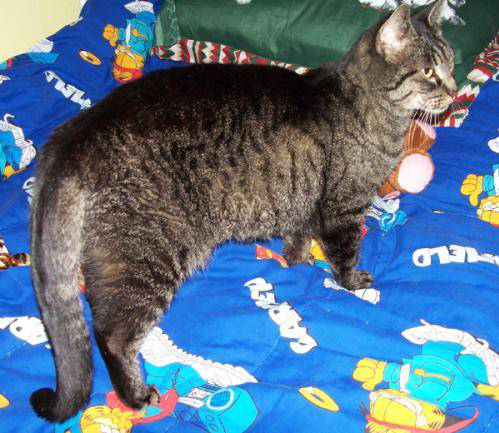

In [21]:
example_image_fn = path/'valid'/'cats'/'cat.2994.jpg'
example_image = PILImage.create(example_image_fn)
example_image

We need to convert the image to a tensor, resize, and normalize it. We can do this using the same transforms as we used for the training set.

In [22]:
import torchvision.transforms as T

In [23]:
example_image = example_image.resize((sz,sz))

In [24]:
example_image_t = T.ToTensor()(example_image)

In [25]:
example_image_t.shape

torch.Size([3, 224, 224])

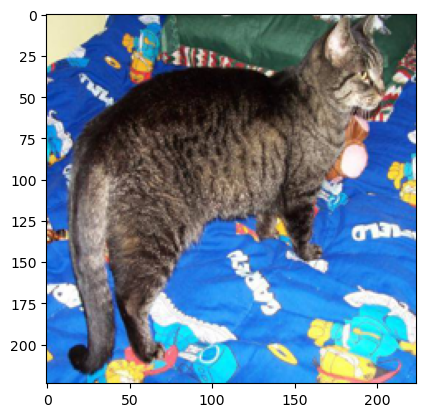

In [26]:
plt.imshow(example_image_t.permute(1,2,0).numpy())

To ensure that PyTorch stores the gradients, we need to set the requires_grad attribute of the tensor to True. We can do this using the `.requires_grad_()` method.

In [27]:
# **Setting requires_grad_ to True is crucial for tracking gradients**
# This tells PyTorch to keep track of any computations performed on this tensor
# so we can calculate gradients needed for the adversarial attack.
example_image_t= example_image_t.requires_grad_(True)

We can now send the image through the model:

In [28]:
example_image_output = learn.model(example_image_t[None])

This returns the model's confidence scores for dogs and cats:

In [29]:
example_image_output

TensorBase([[0.4233, 0.1497]], grad_fn=<AliasBackward0>)

These are the activations. We apply the softmax function to get the probabilities:

In [30]:
example_image_output = F.softmax(example_image_output, dim=-1)
example_image_output

TensorBase([[0.5680, 0.4320]], grad_fn=<AliasBackward0>)

What's the assigned label?

In [31]:
example_image_predicted_label = torch.argmax(example_image_output)

print(learn.dls.vocab[example_image_predicted_label])

cats


Now we can perform the attack

In [32]:
loss = learn.loss_func(example_image_output, example_image_predicted_label)
print(loss)

TensorBase(0.6275, grad_fn=<AliasBackward0>)


We compute the gradient of the loss with the respect to the image we fed through the model:

In [33]:
learn.zero_grad()
loss.backward()

We've asked PyTorch to store the gradient for the input image (tensor):

In [34]:
# **Access the calculated gradients for the input image**
# These gradients are essential for the FSGM attack. PyTorch stored them 
# since we set requires_grad_ to True for our image tensor.
image_grad = example_image_t.grad.data
print(image_grad.shape)

torch.Size([3, 224, 224])


In [35]:
image_grad[0,:3,:3]

tensor([[ 0.0006,  0.0033,  0.0025],
        [ 0.0036,  0.0113,  0.0073],
        [ 0.0037,  0.0046, -0.0017]])

Here's the attack:

We first collect the element-wise signs of the gradient. This simply means that we collect the sign of the above gradient element-wise (i.e., whether or not each element is positive or negative). 

In [36]:
sign_image_grad = image_grad.sign()
print(sign_image_grad[:3,:3,:3])

tensor([[[ 1.,  1.,  1.],
         [ 1.,  1.,  1.],
         [ 1.,  1., -1.]],

        [[ 1.,  1.,  1.],
         [ 1.,  1., -1.],
         [ 1., -1., -1.]],

        [[ 1., -1., -1.],
         [ 1.,  1., -1.],
         [ 1., -1., -1.]]])


We can now move the image in the direction of the gradient:

In [37]:
epsilon = 0.01

In [38]:
perturbed_example_image = example_image_t + epsilon*sign_image_grad

In [39]:
print(perturbed_example_image[:3,:3,:3])

tensor([[[0.9473, 0.9473, 0.9473],
         [0.9473, 0.9473, 0.9473],
         [0.9473, 0.9473, 0.9273]],

        [[0.9276, 0.9276, 0.9276],
         [0.9276, 0.9276, 0.9076],
         [0.9276, 0.9076, 0.9076]],

        [[0.7629, 0.7429, 0.7429],
         [0.7629, 0.7629, 0.7429],
         [0.7629, 0.7429, 0.7429]]], grad_fn=<SliceBackward0>)


Note that the addition of epsilon times the sign of the gradient can make some values of the image go outside the range [0, 1]. We can fix this by clipping the values to be between 0 and 1:

In [40]:
print(perturbed_example_image.max())

tensor(1.0100, grad_fn=<MaxBackward1>)


In [41]:
perturbed_example_image = torch.clamp(perturbed_example_image, 0, 1)

In [42]:
print(perturbed_example_image.max())

tensor(1., grad_fn=<MaxBackward1>)


By adding the gradient to the image, we are increasing the loss function. We can see this by running the image through the model again and computing the loss with respect to the original label:

In [43]:
print(f"Original loss: {float(loss)}")

Original loss: 0.6274685859680176


In [44]:
with torch.no_grad():
    new_loss = learn.loss_func(learn.model(perturbed_example_image[None]), torch.argmax(example_image_output))
    print(f"New loss: {new_loss}")

New loss: 12.942171096801758


Let's have a look at the perturbed image:

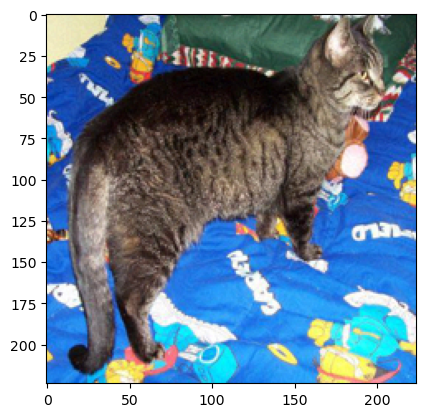

In [45]:
plt.imshow(perturbed_example_image.detach().cpu().permute(1, 2, 0).numpy())

Still looks very much like a cat.

Let's check what the model predicts for the perturbed image:

In [49]:
perturbed_output = learn.model(perturbed_example_image[None])
print(learn.dls.vocab[torch.argmax(perturbed_output)])

dogs


Uh-oh...

What did we add to the image? 

In [ ]:
diff_image = example_image_t - perturbed_example_image

In [ ]:
diff_image.max(), diff_image.min()

(tensor(0.0100, grad_fn=<MaxBackward1>),
 tensor(-0.0100, grad_fn=<MinBackward1>))

We rescale it so that it is visible:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


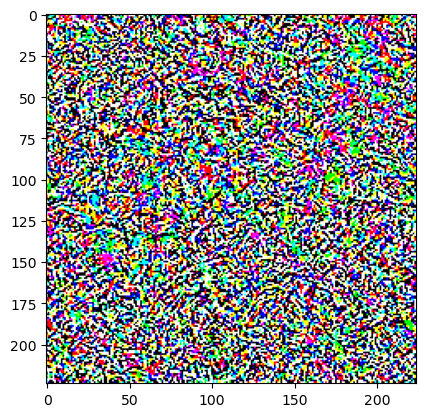

In [ ]:
plt.imshow(diff_image.detach().cpu().permute(1, 2, 0).numpy()*255)
plt.show()

> **The role of epsilon ($\epsilon$) in FGSM:** <br> The epsilon (ϵ) value controls the magnitude of the perturbation added to the image.<br>
> * A smaller epsilon creates a subtler change, potentially making the adversarial example harder to detect by humans but less effective in fooling the model.
> * A larger epsilon creates a more noticeable change but might be easier for the model to identify as an adversarial example.


In [2]:
# Example image gradient (shape corresponds to a single pixel)
image_gradient = torch.tensor([[0.1, 0.2, 0.3]])  

# Epsilon value controlling perturbation magnitude
epsilon = 0.05

# Original pixel value (now also a tensor for consistency)
original_pixel = torch.tensor([[0.5, 0.5, 0.5]])  

# Apply the perturbation (broadcasting will add it to each color channel)
perturbation = epsilon * image_gradient
adversarial_pixel = torch.clamp(original_pixel + perturbation, 0, 1)

print("Original pixel:", original_pixel)
print("Perturbation:", perturbation)
print("Adversarial pixel:", adversarial_pixel)



Original pixel: tensor([[0.5000, 0.5000, 0.5000]])
Perturbation: tensor([[0.0050, 0.0100, 0.0150]])
Adversarial pixel: tensor([[0.5050, 0.5100, 0.5150]])


### Save the result for use later

In [50]:
plt.imsave('perturbed_cat.png', perturbed_example_image.detach().permute(1, 2, 0).numpy())

## Run the attack on more data

Here's the code for the attack. It's pretty simple, just a few lines of code. We need the image that we want to attack and the gradient of the loss function with respect to the image. We then add the gradient to the image, and clip the values to be between 0 and 1. The function is based on the one in the PyTorch tutorial: https://pytorch.org/tutorials/beginner/fgsm_tutorial.html

In [51]:
def fgsm_attack(image, epsilon, image_grad):
    """
    Perform the Fast Gradient Sign Method (FGSM) attack on an image.

    Parameters:
    image: The original image.
    epsilon: The epsilon value used to perturb the image.
    image_grad: The gradients of the image.

    Returns:
    perturbed_image: The perturbed image.
    """
    
    # Collect the element-wise sign of the image gradient
    sign_image_grad = image_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image + epsilon*sign_image_grad
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image

Here's a function that implements what we did to perturb the example image above:

In [52]:
def perturb(learn, img_path, epsilon):
    """
    Perform an adversarial attack on an image and return the perturbed image and the predicted labels.

    Parameters:
    learn: The Learner object.
    img_path: The path to the image to be perturbed.
    epsilon: The epsilon value used to perturb the image.

    Returns:
    perturbed_image: The perturbed image.
    predicted_label: The label predicted for the original image.
    perturbed_label: The label predicted for the perturbed image.
    """

    # Perform the transformations and instruct PyTorch to track the gradients
    img_t = T.ToTensor()(PILImage.create(img_path).resize((sz,sz)))
    img_t = img_t.requires_grad_(True)

    output = learn.model(img_t[None])

    # Here's the prediction before the attack
    predicted_label = torch.argmax(output)

    # Perform the attack
    loss = learn.loss_func(output, predicted_label)
    learn.zero_grad()
    loss.backward()
    img_t_grad = img_t.grad.data
    perturbed_image = fgsm_attack(img_t, epsilon, img_t_grad)

    # Here's the prediction after the attack
    perturbed_output = learn.model(perturbed_image[None])
    perturbed_label = torch.argmax(perturbed_output)

    # We need to convert the image back to numpy for plotting
    perturbed_image = perturbed_image.detach().cpu().permute(1, 2, 0).numpy()

    return perturbed_image, learn.dls.vocab[predicted_label], learn.dls.vocab[perturbed_label]


In [53]:
def show_perturbed_img(original_image, predicted_label, perturbed_image, perturbed_label, epsilon):
    """
    Display an original image and its perturbed version side by side.

    Parameters:
    original_image: The original image.
    predicted_label: The label predicted for the original image.
    perturbed_image: The perturbed image.
    perturbed_label: The label predicted for the perturbed image.
    epsilon: The epsilon value used to perturb the image.
    """
    
    f, ax = plt.subplots(1,2, figsize=(10,10))

    ax[0].imshow(PILImage.create(original_image).resize((sz,sz)))
    ax[0].axis('off')
    ax[0].set_title(f"Original image. Label: {predicted_label}")

    ax[1].imshow(perturbed_image)
    ax[1].axis('off')
    ax[1].set_title(f"Perturbed image. Label: {perturbed_label}; Epsilon: {epsilon}")

    plt.show()

In [54]:
epsilon=0.002

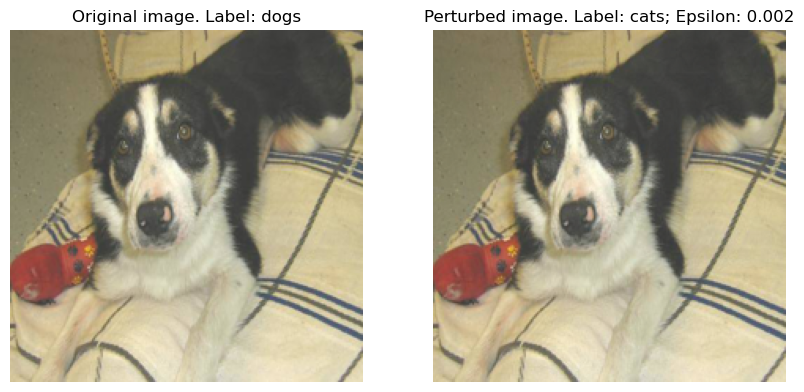

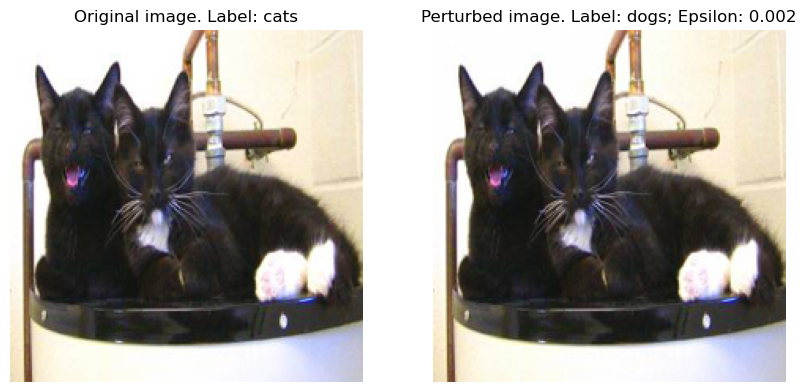

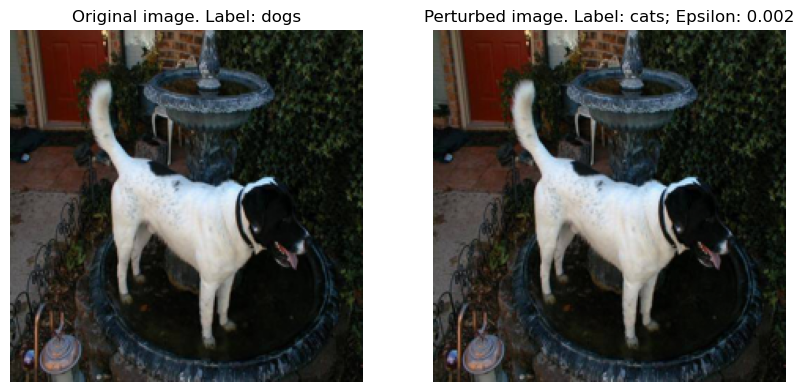

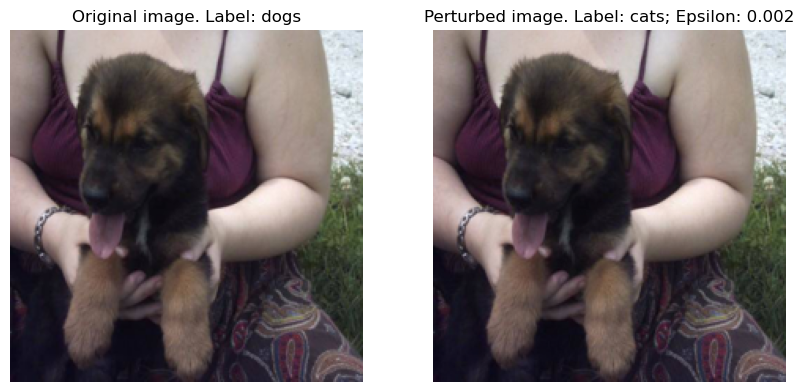

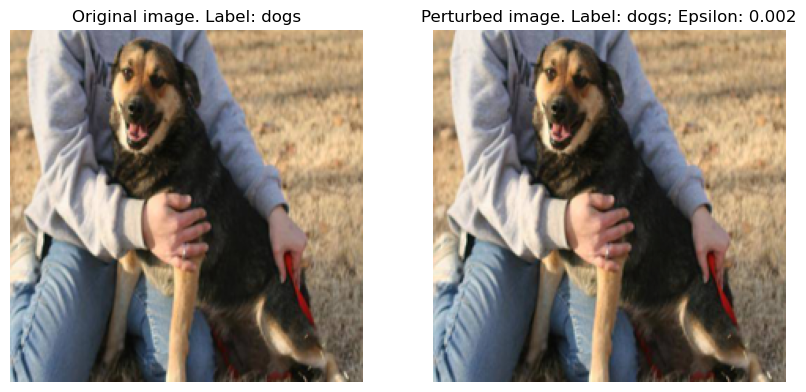

In [55]:
for test_img in random.choices(dls.valid_ds.items, k=5):
    perturbed_image, predicted_label, perturbed_label = perturb(learn, test_img, epsilon)
    show_perturbed_img(test_img, predicted_label, perturbed_image, perturbed_label, epsilon=epsilon)

Let's grab a few successful and unsuccessful attacks:

In [56]:
epsilons = [0.0001, 0.0005, 0.001, 0.005]

In [57]:
successful_attacks = []
unsuccessful_attacks = []

In [58]:
n=10

In [ ]:
for img in dls.valid_ds.items:
    # Loop over different epsilon values
    for epsilon in epsilons:
        try:
            # Perform the adversarial attack on the image
            perturbed_image, predicted_label, perturbed_label = perturb(learn, img, epsilon)
            # If the attack was successful, add it to the list of unsuccessful attacks
            if predicted_label != perturbed_label:
                successful_attacks.append((img, predicted_label, perturbed_image, perturbed_label, epsilon))
                break
        except Exception as e:
            print(f"Error processing image {img}: {e}")
    
    if len(successful_attacks)>=n:
        break

In [ ]:
for img in dls.valid_ds.items:
    # Loop over different epsilon values
    for epsilon in epsilons:
        try:
            # Perform the adversarial attack on the image
            perturbed_image, predicted_label, perturbed_label = perturb(learn, img, epsilon)
            # If the attack was unsuccessful, add it to the list of unsuccessful attacks
            if predicted_label == perturbed_label:
                unsuccessful_attacks.append((img, predicted_label, perturbed_image, perturbed_label, epsilon))
                break
        except Exception as e:
            print(f"Error processing image {img}: {e}")
    
    if len(unsuccessful_attacks)>=n:
        break

In [61]:
len(successful_attacks)

10

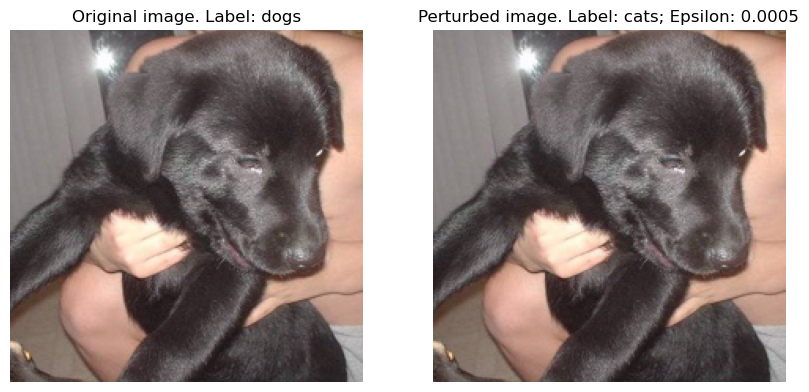

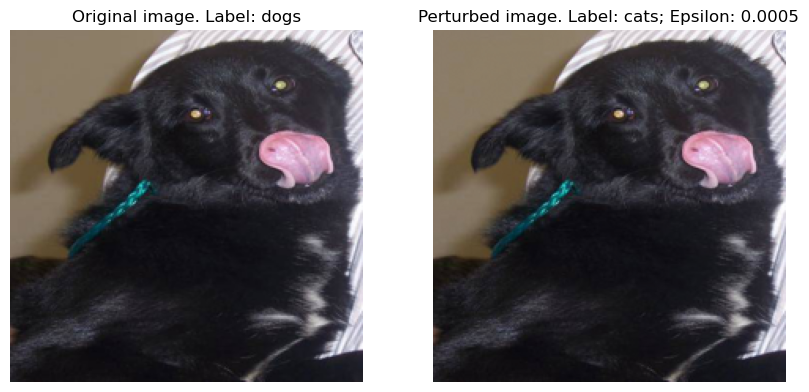

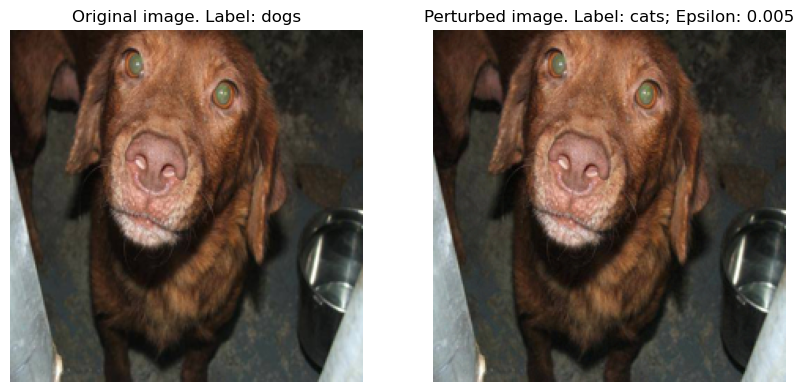

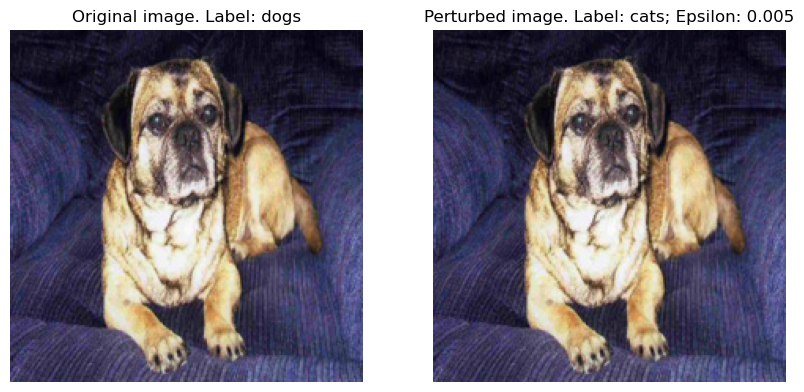

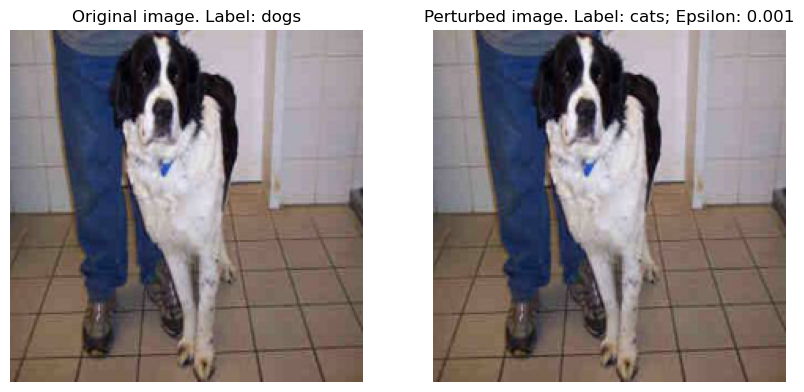

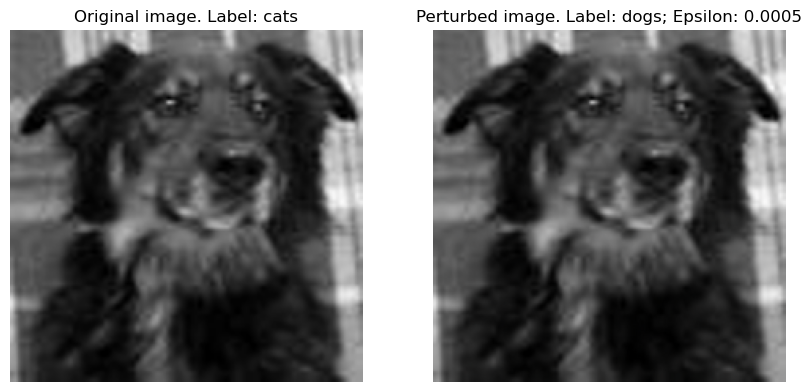

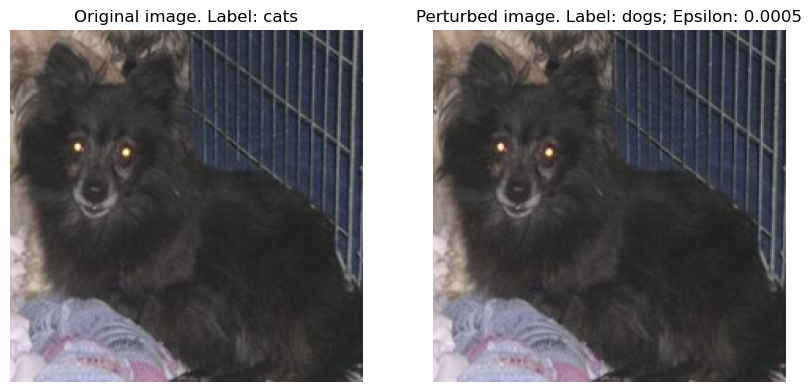

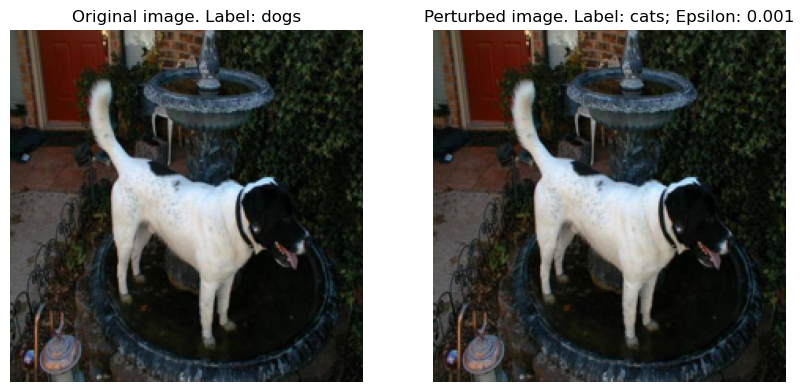

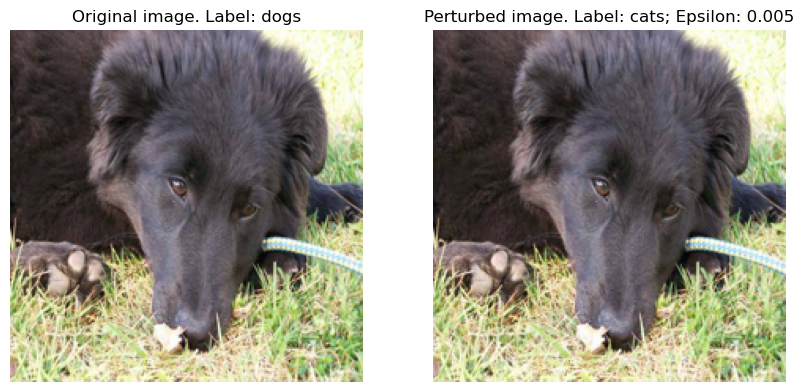

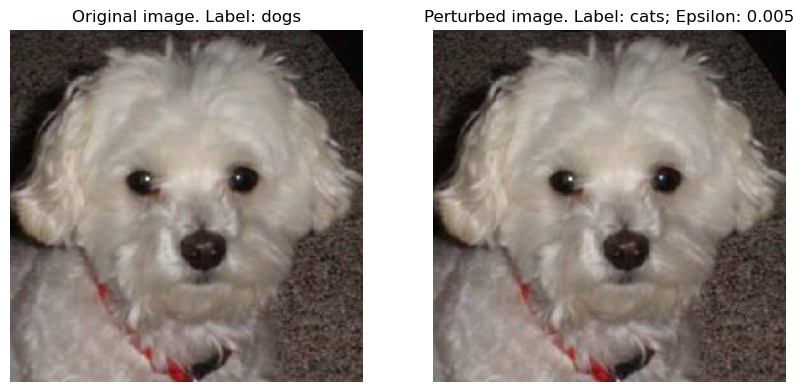

In [62]:
for imgs in successful_attacks:
    show_perturbed_img(imgs[0], imgs[1], imgs[2], imgs[3], imgs[4])

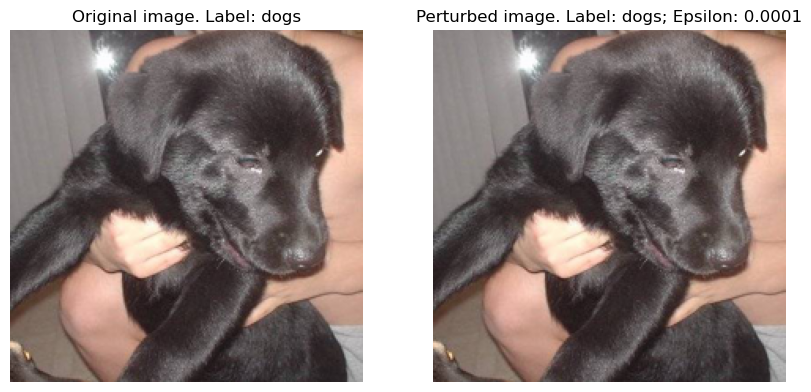

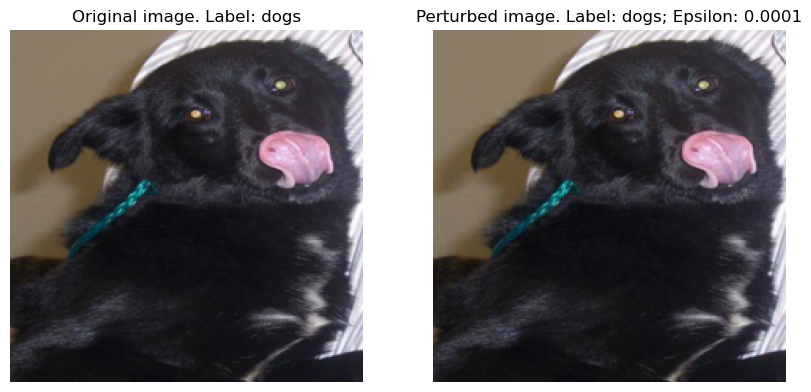

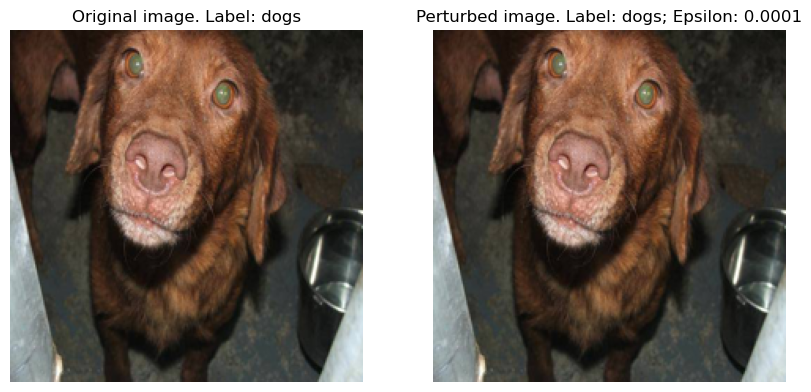

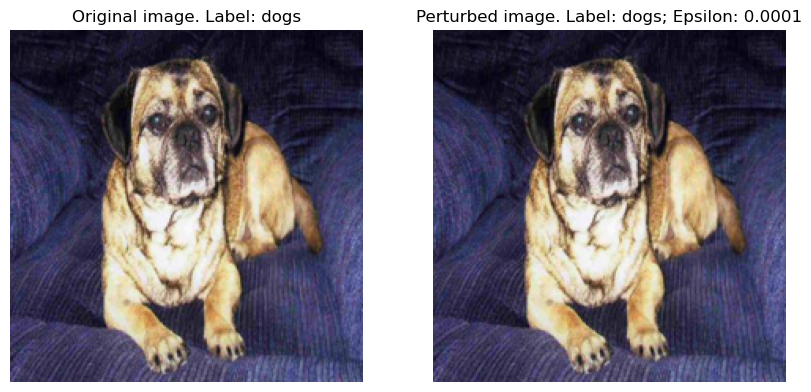

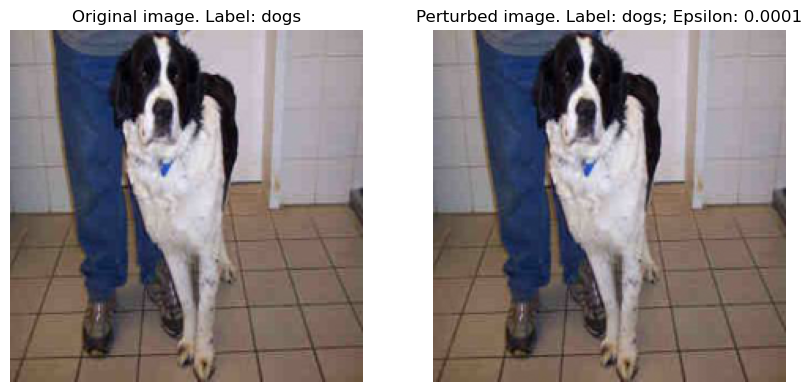

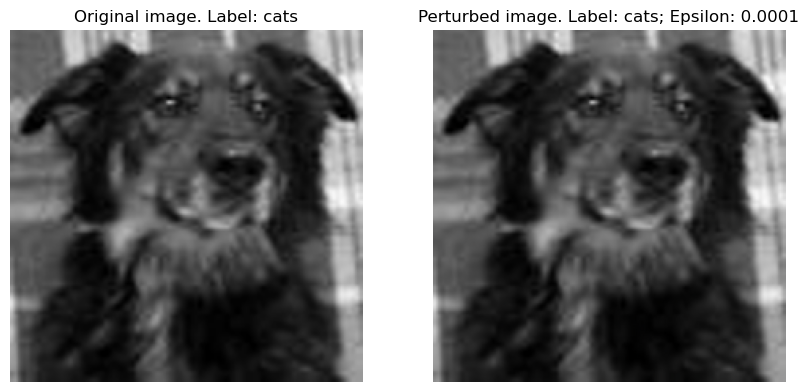

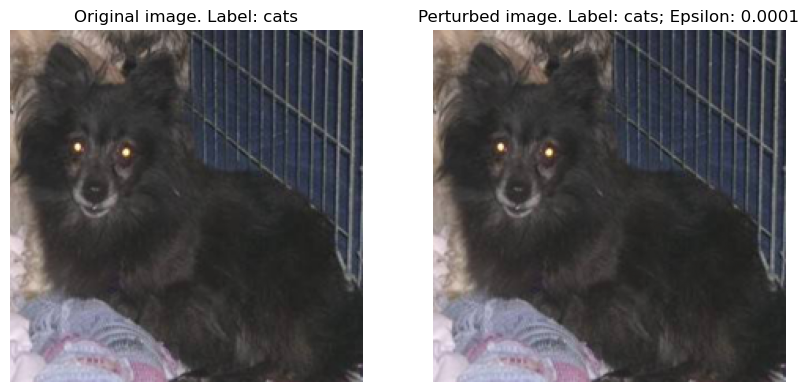

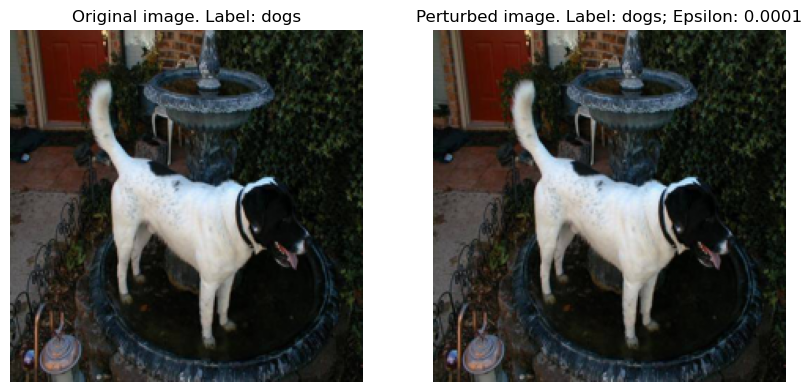

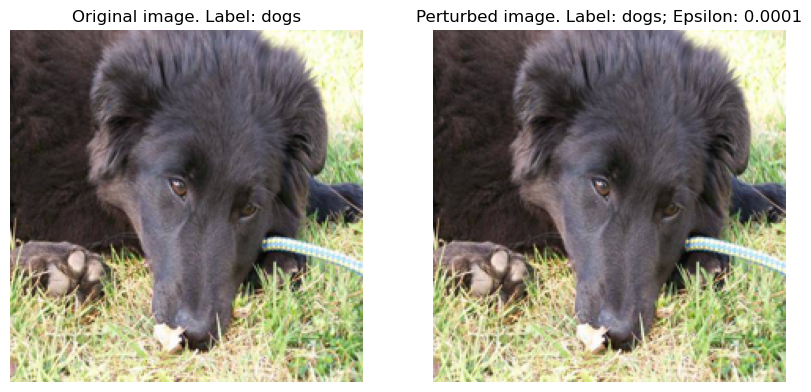

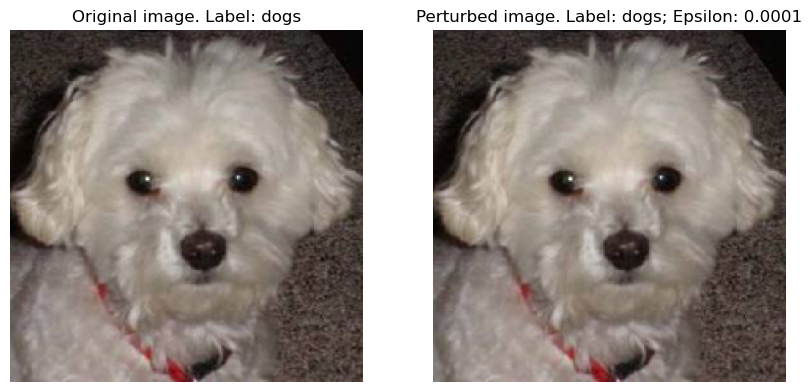

In [63]:
for imgs in unsuccessful_attacks:
    show_perturbed_img(imgs[0], imgs[1], imgs[2], imgs[3], imgs[4])

In the notebook [fgsm-attack-on-a-musculoskeletal-x-ray-model](https://www.kaggle.com/code/alexanderlundervold/fgsm-attack-on-a-musculoskeletal-x-ray-model), we'll use the same attack on a different data set.

# Extra: Class activation maps for "explainable AI"

**Understanding Model Interpretations through Activation Visualization**

A powerful technique for understanding what a deep learning model has learned involves visualizing its internal activations. This is achieved by feeding an input image to the model and then visualizing the resulting activations within the model's layers.

**Key Visualization Methods:**

* **Heatmaps:** Activations can be visually represented as heatmaps, where colors indicate the intensity of neuron responses.
* **Class Activation Maps (CAM):**  CAMs highlight regions in the input image that are most influential in the model's final prediction. They are typically computed using the activations of the last convolutional layer.
* **Gradient-weighted Class Activation Maps (Grad-CAM):** Grad-CAM offers a more generalized and class-discriminative approach. It uses gradients flowing into the final convolutional layer to produce a localization map highlighting the important regions of the input image for a given class.

**Notes:**

* Activation visualization offers valuable insights into how your model "sees" the world, aiding in debugging, understanding biases, and improving model design.
* These techniques work particularly well with convolutional neural networks (CNNs) in image-based tasks.



Let's try Grad-CAM on an example.

In [64]:
# We use the cat image from https://github.com/fastai/fastbook/raw/master/images/chapter1_cat_example.jpg
!wget https://github.com/fastai/fastbook/raw/master/images/chapter1_cat_example.jpg
example_cat = 'chapter1_cat_example.jpg'

--2023-03-22 13:44:41--  https://github.com/fastai/fastbook/raw/master/images/chapter1_cat_example.jpg
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/fastai/fastbook/master/images/chapter1_cat_example.jpg [following]
--2023-03-22 13:44:42--  https://raw.githubusercontent.com/fastai/fastbook/master/images/chapter1_cat_example.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8417 (8,2K) [image/jpeg]
Saving to: ‘chapter1_cat_example.jpg’

chapter1_cat_exampl 100%[===================>]   8,22K  --.-KB/s    in 0s      

2023-03-22 13:44:42 (66,4 MB/s) - ‘chapter1_cat_example.jpg’ saved [8417/8417

In [65]:
example_image = PILImage.create(example_cat)

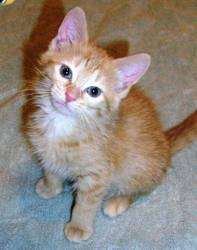

In [66]:
example_image

In [67]:
example_image_t = T.ToTensor()(example_image.resize((sz,sz)))

## Grad-CAM

Here's an implementation of Grad-CAM from the fastai book (https://github.com/fastai/fastbook/blob/master/18_CAM.ipynb), based on hooks. See the end of the notebook for a quick description of hooks. 

In [68]:
class Hook():
    def __init__(self, m):
        self.hook = m.register_forward_hook(self.hook_func)   
    def hook_func(self, m, i, o): self.stored = o.detach().clone()
    def __enter__(self, *args): return self
    def __exit__(self, *args): self.hook.remove()
        
        
class HookBwd():
    def __init__(self, m):
        self.hook = m.register_backward_hook(self.hook_func)   
    def hook_func(self, m, gi, go): self.stored = go[0].detach().clone()
    def __enter__(self, *args): return self
    def __exit__(self, *args): self.hook.remove()

In [69]:
def get_gradcam(img_fn, cls=0):
    img = T.ToTensor()(PILImage.create(img_fn))

    dimensions = img.shape[1:]
        
    with HookBwd(learn.model[0]) as hookg:
        with Hook(learn.model[0]) as hook:
            output = learn.model.eval()(img[None])
            act = hook.stored
        output[0,cls].backward()
        grad = hookg.stored
    
    w = grad[0].mean(dim=[1,2], keepdim=True)
    cam_map = (w * act[0]).sum(0)

    x_dec = TensorImage(dls.valid.decode((img,))[0][0])
    _,ax = plt.subplots()
    x_dec.show(ctx=ax)
    ax.imshow(cam_map.detach().cpu(), alpha=0.3, extent=(0,dimensions[1],dimensions[0],0),
                interpolation='bilinear', cmap='magma')
    plt.show()

/home/alex/anaconda3/envs/fastai/lib/python3.9/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


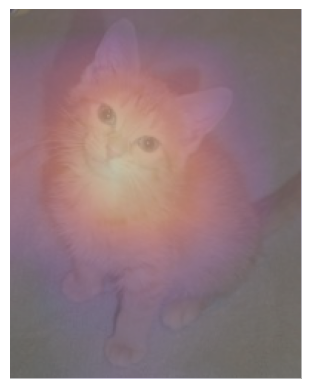

In [70]:
get_gradcam(example_cat, cls=0)

**Perturb the cat**

In [71]:
perturbed_cat, predicted_label, perturbed_label = perturb(learn, example_cat, 0.01)

In [72]:
predicted_label, perturbed_label

('cats', 'cats')

In [73]:
plt.imsave("another_perturbed_cat.png", perturbed_cat)

**Visualize the grad-CAM for the perturbed cat**

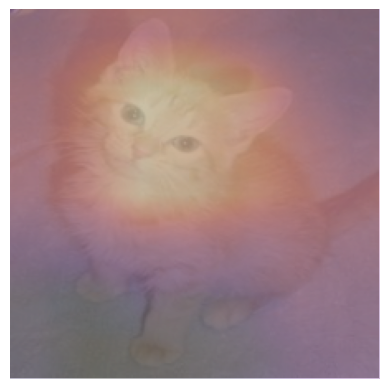

In [74]:
get_gradcam('another_perturbed_cat.png', cls=0)

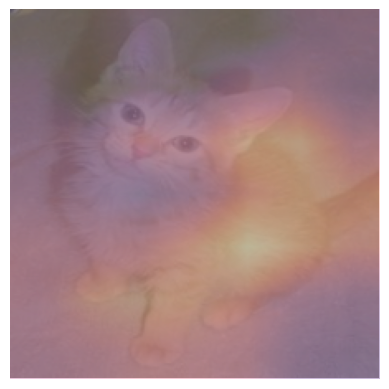

In [75]:
get_gradcam('another_perturbed_cat.png', cls=1)

> Beware of explanations! 

# What are hooks?

Remember that neural networks are **computational graphs**

![](https://docs.chainer.org/en/latest/_images/googlenet.png)<br>
<center><small>Illustration from <a href="https://docs.chainer.org/en/stable/">https://docs.chainer.org/en/stable/</a> </small></center>

**What are hooks?** 

In essence, hooks are callback functions that you can seamlessly integrate into the inner workings of a PyTorch neural network model. They are attached to either:

* Tensors: To monitor and potentially modify gradients flowing through the network.
* Modules (Layers): To observe and potentially alter input or output data during computation.

**Why use them?**

Hooks offer a powerful way to:
* Inspect model behavior: Analyze intermediate values, gradients, and understand how the model processes data.
* Debug: Identify issues such as vanishing or exploding gradients.
* Modify computation: Intercept data or gradients to implement custom behaviors (e.g., gradient clipping, modifying the forward pass).
* Explainable AI (XAI): Create visualizations like Grad-CAM to understand which parts of the input are most important for the model's decision.

**Types of hooks:**
* Forward hooks:  Executed during the forward pass of a module.
* Backward hooks: Executed during the backward pass (gradient calculation) of a module.



- Hooks are functions injected into these computational graphs by attaching them to tensors or to modules (network layers)
- This allows us to access and modify gradients associated with tensors and the inputs and outputs of layers (modules) as they flow through the computational graphs
- We can attach backward and forward hooks to modules: triggered during backward and forward calculations, respectively.





See the fastai book, [Chapter 18](https://github.com/fastai/fastbook/blob/master/18_CAM.ipynb) for more about hooks. The PyTorch docs have a description of hooks here: https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks. See also the Paperspace blog post: https://blog.paperspace.com/pytorch-hooks-gradient-clipping-debugging/. Here's a video tutorial that explains hooks in some detail: https://www.youtube.com/watch?v=syLFCVYua6Q. 